# **CLUSTERING PROJECT** #

### ***CUSTOMER SEGMENTATION & PERSONALITY ANALYSIS*** ###

File : marketing_campaign.xlsx

In [1]:
# import the libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, scale
from sklearn.metrics import silhouette_score
from sklearn.model_selection import GridSearchCV

# Clustering libraries
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
import scipy.cluster.hierarchy as sch # to build dendrogram and build the plotting
plt.rcParams["font.family"] = "Times New Roman"
import warnings
warnings.filterwarnings('ignore')
palette_color = sns.color_palette('rainbow')

### **Importing data from file marketing_campaign.xlsx** ###

In [2]:
# Reading the data from the file 'marketing_campaign.xlsx'
ccspa_orig_data = pd.read_excel("marketing_campaign.xlsx", parse_dates=['Dt_Customer'])
ccspa_orig_data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


In [3]:
ccspa_orig_data.shape

(2240, 29)

#### *Descriptive Analysis* ####

In [4]:
ccspa_orig_data.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,2013-07-10 10:01:42.857142784,49.109375,303.935714,26.302232,166.950000,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,2012-07-30 00:00:00,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,2013-01-16 00:00:00,24.000000,23.750000,1.000000,16.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,2013-07-08 12:00:00,49.000000,173.500000,8.000000,67.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,2013-12-30 06:00:00,74.000000,504.250000,33.000000,232.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,2014-06-29 00:00:00,99.000000,1493.000000,199.000000,1725.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,NaN,28.962453,336.597393,39.773434,225.715373,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274


In [5]:
ccspa_orig_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

#### *Checking for missing values* ####

In [6]:
# check for missing values
ccspa_orig_data.isna().sum() # The result shows that there are no missing values


ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [7]:
ccspa_orig_data[ccspa_orig_data['Income'].isna() == True]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
10,1994,1983,Graduation,Married,NaN,1,0,2013-11-15,11,5,...,7,0,0,0,0,0,0,3,11,0
27,5255,1986,Graduation,Single,NaN,1,0,2013-02-20,19,5,...,1,0,0,0,0,0,0,3,11,0
43,7281,1959,PhD,Single,NaN,0,0,2013-11-05,80,81,...,2,0,0,0,0,0,0,3,11,0
48,7244,1951,Graduation,Single,NaN,2,1,2014-01-01,96,48,...,6,0,0,0,0,0,0,3,11,0
58,8557,1982,Graduation,Single,NaN,1,0,2013-06-17,57,11,...,6,0,0,0,0,0,0,3,11,0
71,10629,1973,2n Cycle,Married,NaN,1,0,2012-09-14,25,25,...,8,0,0,0,0,0,0,3,11,0
90,8996,1957,PhD,Married,NaN,2,1,2012-11-19,4,230,...,9,0,0,0,0,0,0,3,11,0
91,9235,1957,Graduation,Single,NaN,1,1,2014-05-27,45,7,...,7,0,0,0,0,0,0,3,11,0
92,5798,1973,Master,Together,NaN,0,0,2013-11-23,87,445,...,1,0,0,0,0,0,0,3,11,0
128,8268,1961,PhD,Married,NaN,0,1,2013-07-11,23,352,...,6,0,0,0,0,0,0,3,11,0


In [8]:
# Creating a replicate 'ldc_data' of the original DataFrame 'ldc_orig_data'
ccspa_data = ccspa_orig_data.copy()

In [9]:
# Dropping the missing values
ccspa_data['Income'] = ccspa_data['Income'].fillna(0)
ccspa_data.isna().sum() # The result shows that there are no missing values


ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

In [10]:
ccspa_data['Response'].value_counts()

Response
0    1906
1     334
Name: count, dtype: int64

#### *Checking for Null Values* ####

In [11]:
# Checking to see if there are any null values
# We can get this information using fraud_orig_data.info() option as well
ccspa_data.isnull().sum() # The result shows that there are no null values

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

#### *Checking for duplicates* ####

In [12]:
# Checking for Duplicate Values
ccspa_data.duplicated()  # if any 2 rows has same values

0       False
1       False
2       False
3       False
4       False
        ...  
2235    False
2236    False
2237    False
2238    False
2239    False
Length: 2240, dtype: bool

In [13]:
# Count of duplicated rows
ccspa_data[ccspa_data.duplicated()].shape # We see that there are no duplicate

(0, 29)

#### *Rename Columns* ####

In [14]:
# Renaming column names
ccspa_data.rename(columns = {'Year_Birth':'YOB','Marital_Status': 'MS'}, inplace = True)
ccspa_data.head()

,ID,YOB,Education,MS,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


In [15]:
# Removing the ID column as it does not have much relevance
ccspa_data = ccspa_data.drop(['ID'], axis = 'columns')

In [16]:
# Changing the 'Marital_Status' and 'Education' columns to categorical columns
for col in ['MS', 'Education']:
    ccspa_data[col] = ccspa_data[col].astype('category')

#### ***Segregating the columns into Numeric and Non-Numeric*** ####

In [17]:
categorical_cols = []
numeric_cols = []
for columns in ccspa_data.columns:
      if ((ccspa_data[columns].dtypes == 'object') or (ccspa_data[columns].dtypes == 'category')):
            categorical_cols.append(columns)
            print(f"There are {len(ccspa_data[columns].unique())} unique values in the categorical column name '{columns}'")
      elif ((ccspa_data[columns].dtypes != 'object') and (ccspa_data[columns].dtypes != 'category')):
            numeric_cols.append(columns)

print("\nThe categorical columns are: ",categorical_cols,"\n")
print("The numeric columns are: ",numeric_cols,"\n")

There are 5 unique values in the categorical column name 'Education'
There are 8 unique values in the categorical column name 'MS'

The categorical columns are:  ['Education', 'MS'] 

The numeric columns are:  ['YOB', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'] 



In [18]:
# Categorical variables
for columns in ccspa_data[categorical_cols].columns:
        unique_count = len(ccspa_data[columns].unique())
        print("\n------------------------------------------")
        print(f"There are {unique_count} unique columns in the column name '{columns}'")
        print("\n",ccspa_data[columns].value_counts())


------------------------------------------
There are 5 unique columns in the column name 'Education'

 Education
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: count, dtype: int64

------------------------------------------
There are 8 unique columns in the column name 'MS'

 MS
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64


In [19]:
ccspa_data[numeric_cols].head()

,YOB,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,58138.0,0,0,2012-09-04,58,635,88,546,172,...,7,0,0,0,0,0,0,3,11,1
1,1954,46344.0,1,1,2014-03-08,38,11,1,6,2,...,5,0,0,0,0,0,0,3,11,0
2,1965,71613.0,0,0,2013-08-21,26,426,49,127,111,...,4,0,0,0,0,0,0,3,11,0
3,1984,26646.0,1,0,2014-02-10,26,11,4,20,10,...,6,0,0,0,0,0,0,3,11,0
4,1981,58293.0,1,0,2014-01-19,94,173,43,118,46,...,5,0,0,0,0,0,0,3,11,0


In [20]:
ccspa_data[categorical_cols].head()

,Education,MS
0,Graduation,Single
1,Graduation,Single
2,Graduation,Together
3,Graduation,Together
4,PhD,Married


In [21]:
# Creating dataframes for both categorical data as well as numeric data
ccspa_data_cat = pd.DataFrame()
ccspa_data_num = pd.DataFrame()

ccspa_data_cat = ccspa_data[categorical_cols]
ccspa_data_num = ccspa_data[numeric_cols]

print(f"The numerical data is - \n{ccspa_data_cat.head()}\n\nThe categorical data is - \n{ccspa_data_num.head()}")

The numerical data is - 
    Education        MS
0  Graduation    Single
1  Graduation    Single
2  Graduation  Together
3  Graduation  Together
4         PhD   Married

The categorical data is - 
    YOB   Income  Kidhome  Teenhome Dt_Customer  Recency  MntWines  MntFruits  \
0  1957  58138.0        0         0  2012-09-04       58       635         88   
1  1954  46344.0        1         1  2014-03-08       38        11          1   
2  1965  71613.0        0         0  2013-08-21       26       426         49   
3  1984  26646.0        1         0  2014-02-10       26        11          4   
4  1981  58293.0        1         0  2014-01-19       94       173         43   

   MntMeatProducts  MntFishProducts  ...  NumWebVisitsMonth  AcceptedCmp3  \
0              546              172  ...                  7             0   
1                6                2  ...                  5             0   
2              127              111  ...                  4             0   
3       

In [22]:
ccspa_data_num.head()

,YOB,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,58138.0,0,0,2012-09-04,58,635,88,546,172,...,7,0,0,0,0,0,0,3,11,1
1,1954,46344.0,1,1,2014-03-08,38,11,1,6,2,...,5,0,0,0,0,0,0,3,11,0
2,1965,71613.0,0,0,2013-08-21,26,426,49,127,111,...,4,0,0,0,0,0,0,3,11,0
3,1984,26646.0,1,0,2014-02-10,26,11,4,20,10,...,6,0,0,0,0,0,0,3,11,0
4,1981,58293.0,1,0,2014-01-19,94,173,43,118,46,...,5,0,0,0,0,0,0,3,11,0


### **Visualizations** ###

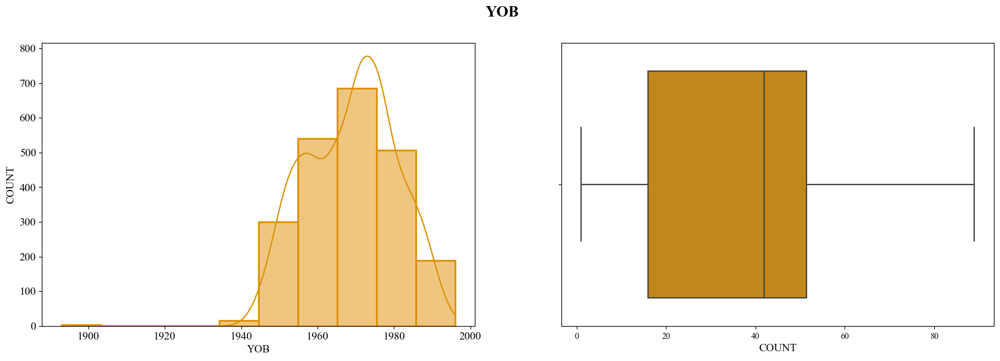

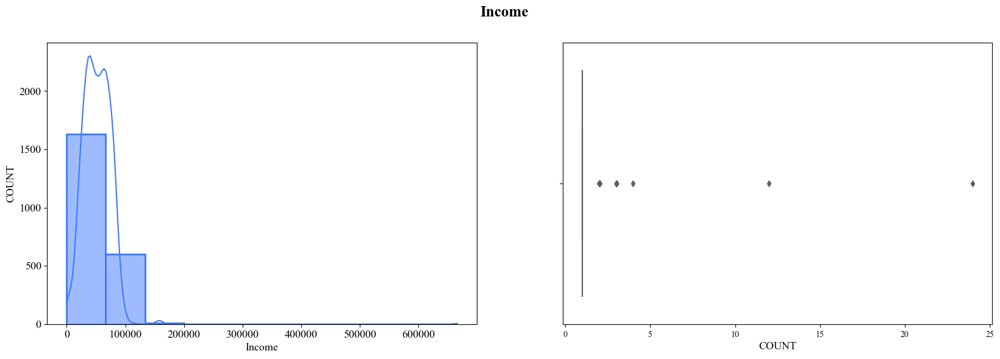

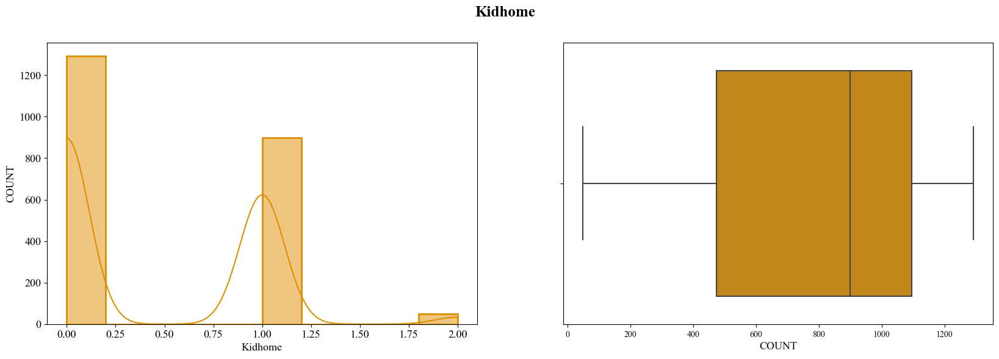

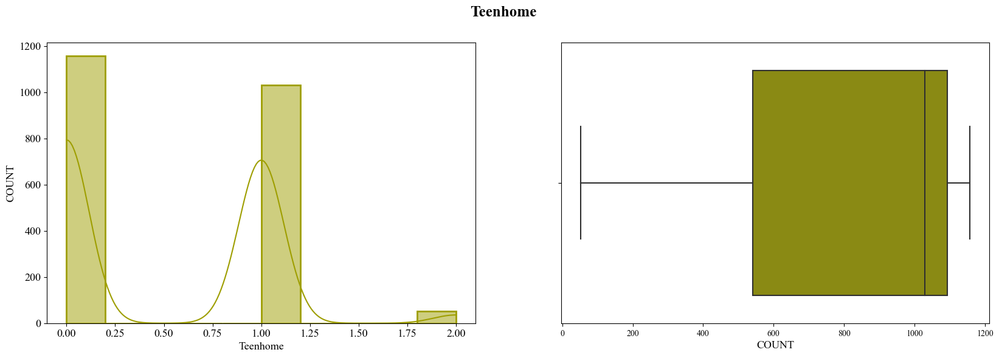

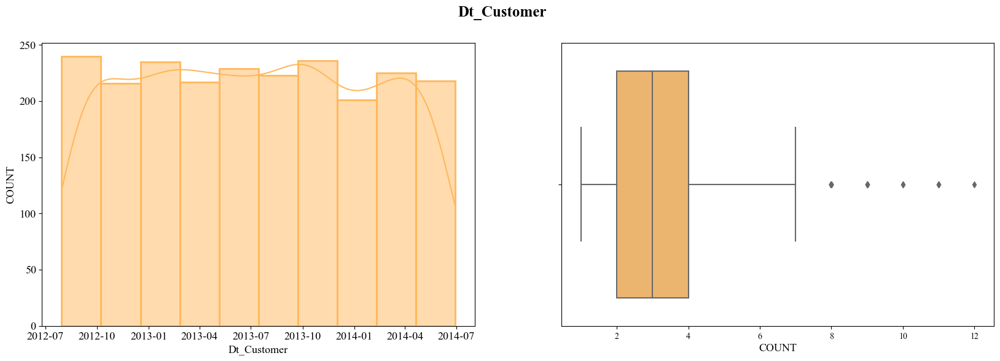

...

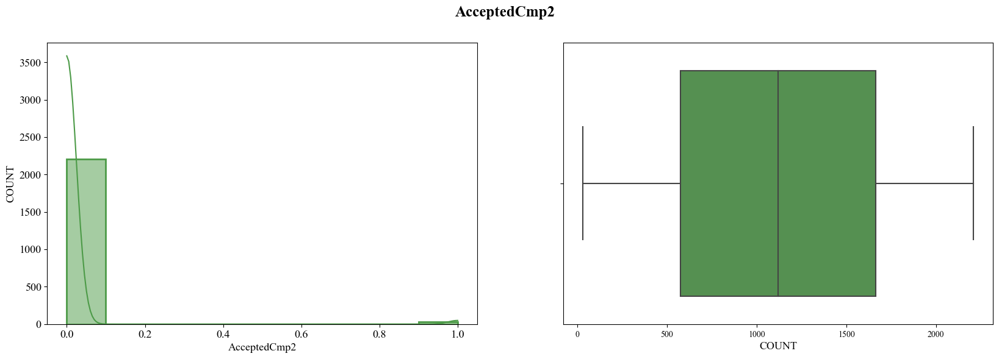

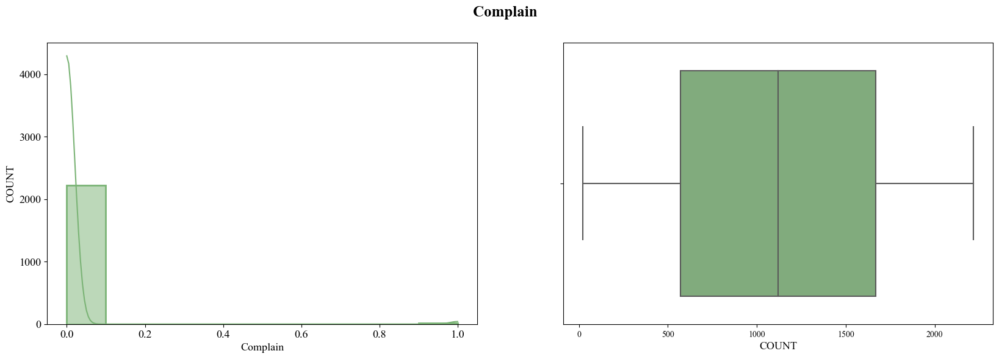

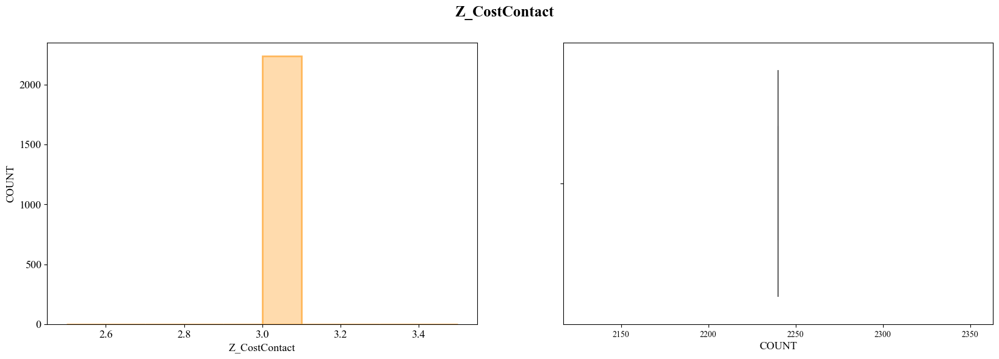

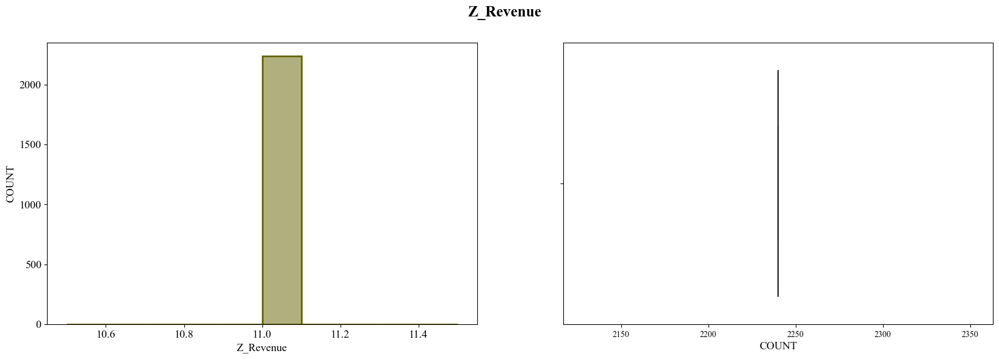

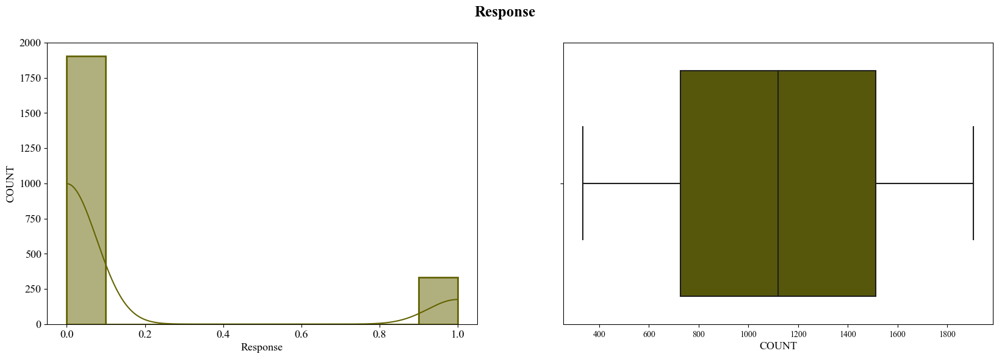

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import random
import pylab
def plot_data(data,feature):
    plt.figure(figsize=(20,6))
    plt.subplot(1,2,1)
    plot = sns.histplot(data, x=feature, color=color, edgecolor=color, linewidth=2, bins=10, kde=True)
    plt.xticks(rotation=0,  size = '13')
    plt.yticks(rotation=0,  size = '13')
    plt.xlabel(feature, rotation=0, size = '13')
    plt.ylabel("COUNT", rotation=90, size = '13')
    # plt.ylabel(rotation=0, size = '13')

    plt.subplot(1,2,2)
    sns.boxplot(x=data[feature].value_counts(), color=color)
    plt.setp(plot.get_xticklabels(), rotation=0, size = '13')
    plt.setp(plot.get_yticklabels(), rotation=0, size = '13')
    plt.xlabel("COUNT", rotation=0, size = '13')
    plt.suptitle(feature, weight='bold',  size = '18')

for n_cols in ccspa_data_num:
    colors = ['#4c9a47','#90c08c','#598eff','#636300','#74a3ff','#bebe00','#7ab375','#808000','#0541ff','#9e9e00','#ffc274','#de8f00','#64a65e','#2260ff','#ffb85c','#3e78ff']
    color = random.choice(colors)
    plot_data(ccspa_data_num,n_cols)

Most of the columns are left skewed

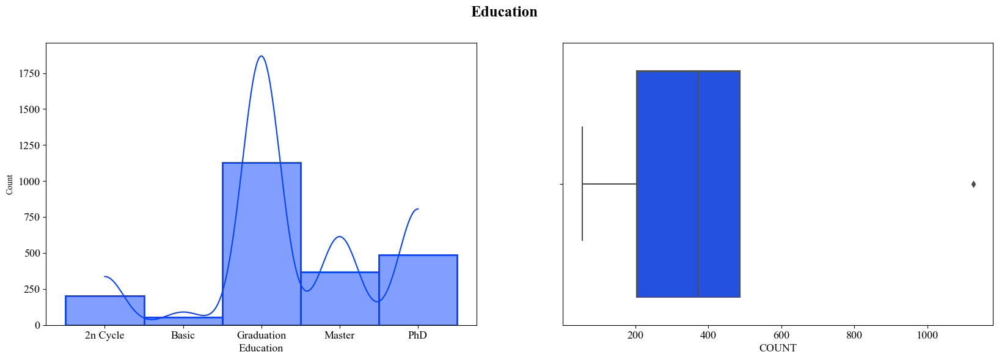

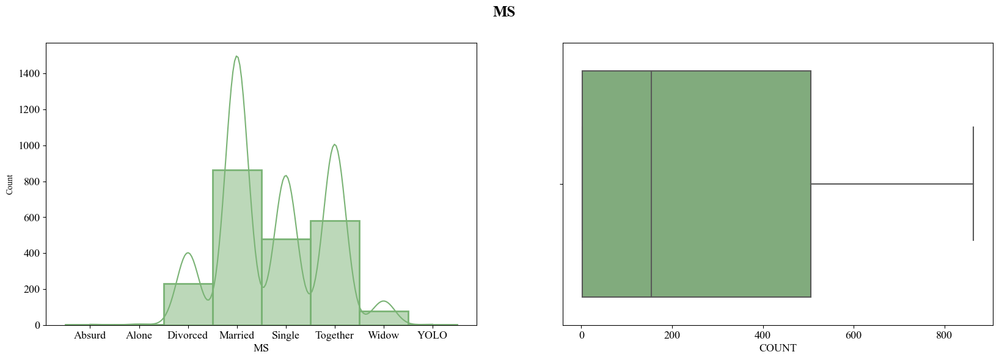

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import random
import pylab
def plot_data(data,feature):
    plt.figure(figsize=(20,6))
    plt.subplot(1,2,1)
    plt.xticks(rotation=0, size = '13')
    plt.yticks(rotation=0, size = '13')
    plt.xlabel("COUNT", rotation=90, size = '13')
    plt.xlabel(feature, rotation=0, size = '13')
    plot = sns.histplot(data, x=feature, color=color, edgecolor=color, linewidth=2, bins=10, kde=True)

    plt.subplot(1,2,2)
    sns.boxplot(x=data[feature].value_counts(), color=color)
    plt.xticks(rotation=0, size = '13')
    plt.xlabel("COUNT", rotation=0, size = '13')
    plt.suptitle(feature, weight='bold', size = '18')

for c_cols in ccspa_data_cat:
    colors = ['#4c9a47','#90c08c','#598eff','#636300','#74a3ff','#bebe00','#7ab375','#808000','#0541ff','#9e9e00','#ffc274','#de8f00','#64a65e','#2260ff','#ffb85c','#3e78ff']
    color = random.choice(colors)
    plot_data(ccspa_data_cat,c_cols)

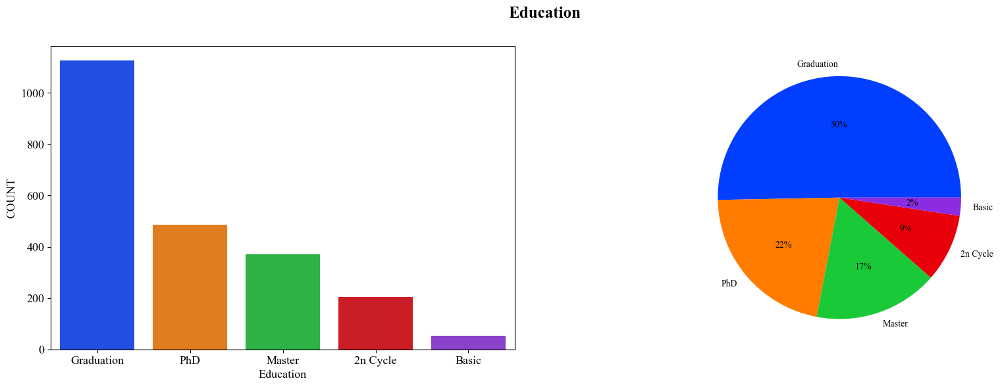

In [25]:
plt.figure(figsize=(20,6))

plt.subplot(1,2,1)
palette_color = sns.color_palette('bright')
sns.countplot(x='Education', data=ccspa_data_cat, palette = palette_color, order=ccspa_data_cat['Education'].value_counts().index )
plt.xticks(rotation=0, size = '13')
plt.yticks(rotation=0, size = '13')
plt.ylabel("COUNT", rotation=90, size = '13')
plt.xlabel('Education', rotation=0, size = '13')

# Display state data in a form of Pie Graph
plt.subplot(1,2,2)
values = ccspa_data_cat['Education'].value_counts().keys().tolist()
counts = ccspa_data_cat['Education'].value_counts().tolist()
plt.pie(ccspa_data_cat['Education'].value_counts(), labels=values, colors=palette_color, autopct='%.0f%%')

plt.suptitle('Education', weight='bold', rotation=0, size = '18')

plt.show()

Most of the customers have completed graduation

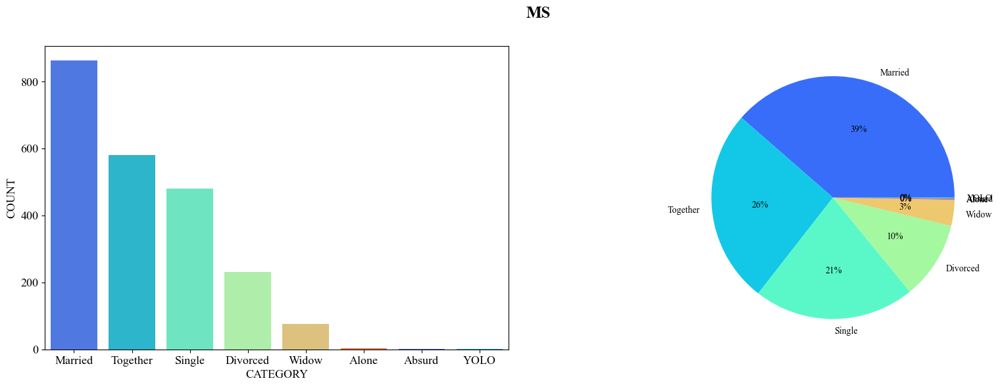

In [26]:
plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
palette_color = sns.color_palette('rainbow')
sns.countplot(x='MS', data=ccspa_data_cat, palette = palette_color, order=ccspa_data_cat['MS'].value_counts().index )
plt.xticks(rotation=0, size = '13')
plt.yticks(rotation=0, size = '13')
plt.ylabel("COUNT", rotation=90, size = '13')
plt.xlabel('CATEGORY', rotation=0, size = '13')
# Display state data in a form of Pie Graph
plt.subplot(1,2,2)
values = ccspa_data_cat['MS'].value_counts().keys().tolist()
counts = ccspa_data_cat['MS'].value_counts().tolist()
plt.pie(ccspa_data_cat['MS'].value_counts(), labels=values, colors=palette_color, autopct='%.0f%%')

plt.suptitle('MS', weight='bold', rotation=0, size = '18')
plt.show()

Most of the customers are married

### **Label Encoding** ###

In [27]:
ccs_data = ccspa_data.copy()
ccs_data.head()

,YOB,Education,MS,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,...,7,0,0,0,0,0,0,3,11,1
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,...,5,0,0,0,0,0,0,3,11,0
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,...,4,0,0,0,0,0,0,3,11,0
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,...,6,0,0,0,0,0,0,3,11,0
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,...,5,0,0,0,0,0,0,3,11,0


In [28]:
ccspa_data_cat.head()

,Education,MS
0,Graduation,Single
1,Graduation,Single
2,Graduation,Together
3,Graduation,Together
4,PhD,Married


In [29]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()

for col in ccspa_data_cat:
  ccs_data[str(col) + "_N"]= label_encoder.fit_transform(ccs_data[col])

In [30]:
ccs_data

,YOB,Education,MS,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Education_N,MS_N
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,...,0,0,0,0,0,3,11,1,2,4
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,...,0,0,0,0,0,3,11,0,2,4
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,...,0,0,0,0,0,3,11,0,2,5
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,...,0,0,0,0,0,3,11,0,2,5
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,...,0,0,0,0,0,3,11,0,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,...,0,0,0,0,0,3,11,0,2,3
2236,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,...,0,0,1,0,0,3,11,0,4,5
2237,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,...,1,0,0,0,0,3,11,0,2,2
2238,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,...,0,0,0,0,0,3,11,0,3,5


##### *The Column data for the Categorical columns is decoded by LabelEncoder in the following way:* #####
| **Column Name** | **1st Category** | **2nd Category** | **3rd Category** | **4th Category** | **5th Category** | **6th Category** | **7th Category** |
| --- | --- | --- | --- | --- | --- | --- | --- |
| **Education_N** | 0 - 2n Cycle | 1 - Basic | 2 - Graduation | 3 - Master | 4 - PhD ||||
| **MS_N** | 0 - Absurd | 1 - Alone | 2 - Divorced | 3 - Married | 4 - Single | 5 - Together | 6 - Widow | 7 - YOLO |

In [31]:
ccs_data.head()

,YOB,Education,MS,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Education_N,MS_N
0,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,...,0,0,0,0,0,3,11,1,2,4
1,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,...,0,0,0,0,0,3,11,0,2,4
2,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,...,0,0,0,0,0,3,11,0,2,5
3,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,...,0,0,0,0,0,3,11,0,2,5
4,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,...,0,0,0,0,0,3,11,0,4,3


In [32]:
# Removing the Categorical Columns once we have desciphered the encoding done by LabelEncoder
ccsdata = ccs_data.drop(['Education','MS', 'Z_Revenue', 'Z_CostContact', 'Dt_Customer'], axis = 'columns')
ccsdata

,YOB,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Education_N,MS_N
0,1957,58138.0,0,0,58,635,88,546,172,88,...,7,0,0,0,0,0,0,1,2,4
1,1954,46344.0,1,1,38,11,1,6,2,1,...,5,0,0,0,0,0,0,0,2,4
2,1965,71613.0,0,0,26,426,49,127,111,21,...,4,0,0,0,0,0,0,0,2,5
3,1984,26646.0,1,0,26,11,4,20,10,3,...,6,0,0,0,0,0,0,0,2,5
4,1981,58293.0,1,0,94,173,43,118,46,27,...,5,0,0,0,0,0,0,0,4,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,61223.0,0,1,46,709,43,182,42,118,...,5,0,0,0,0,0,0,0,2,3
2236,1946,64014.0,2,1,56,406,0,30,0,0,...,7,0,0,0,1,0,0,0,4,5
2237,1981,56981.0,0,0,91,908,48,217,32,12,...,6,0,1,0,0,0,0,0,2,2
2238,1956,69245.0,0,1,8,428,30,214,80,30,...,3,0,0,0,0,0,0,0,3,5


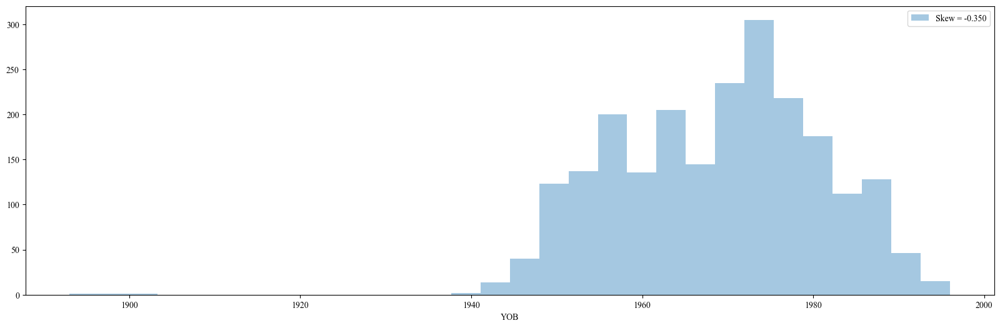

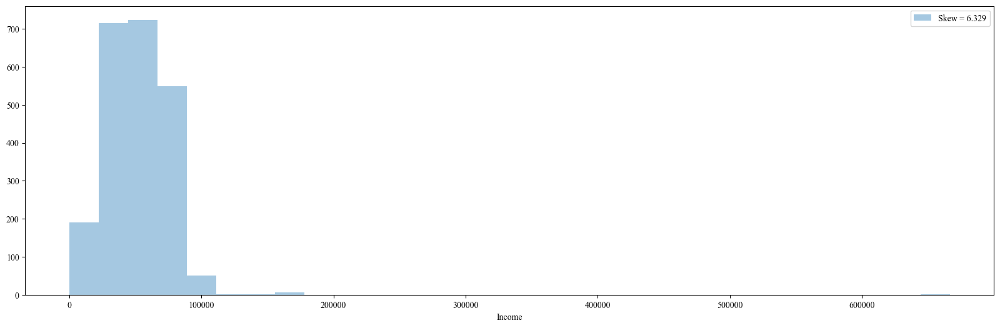

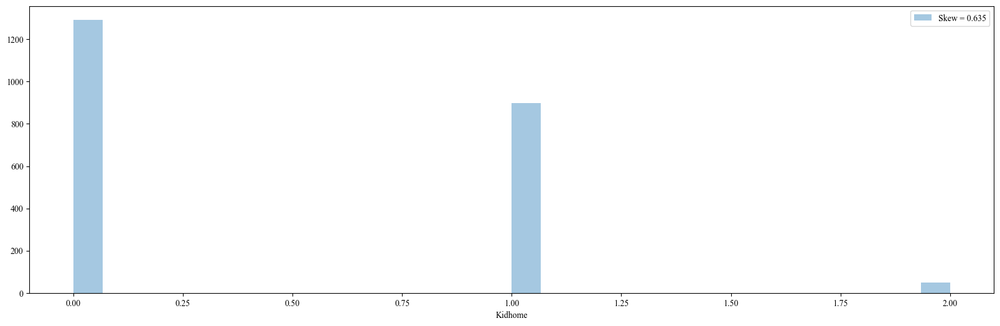

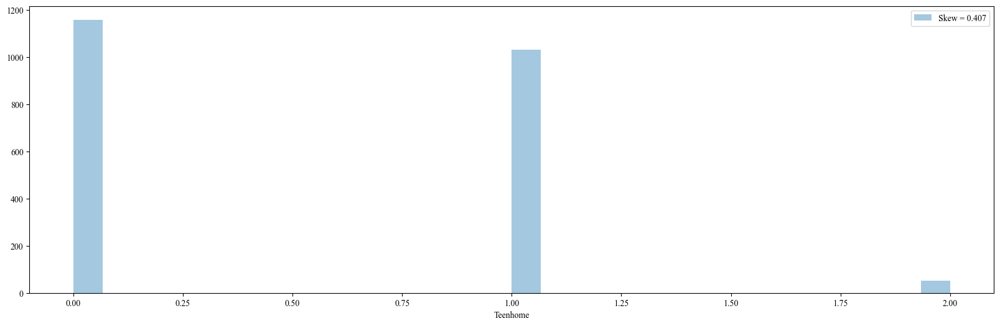

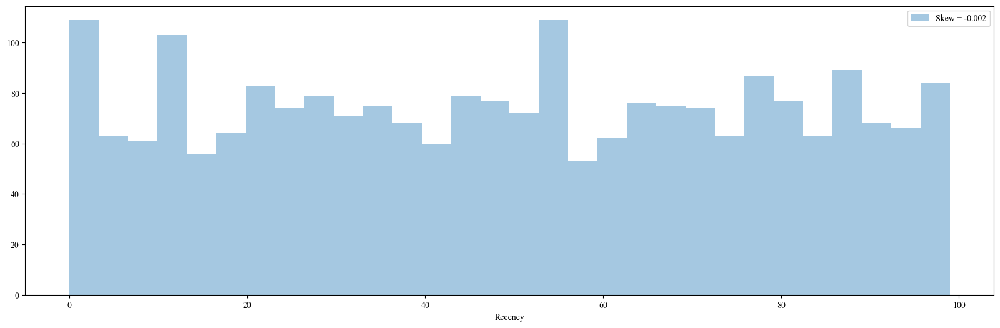

...

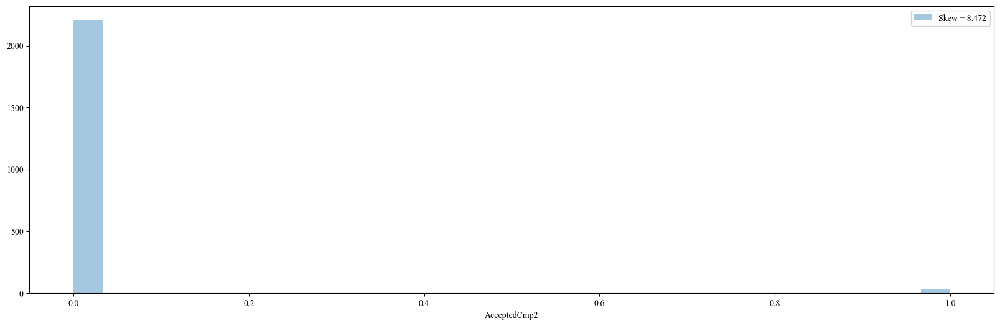

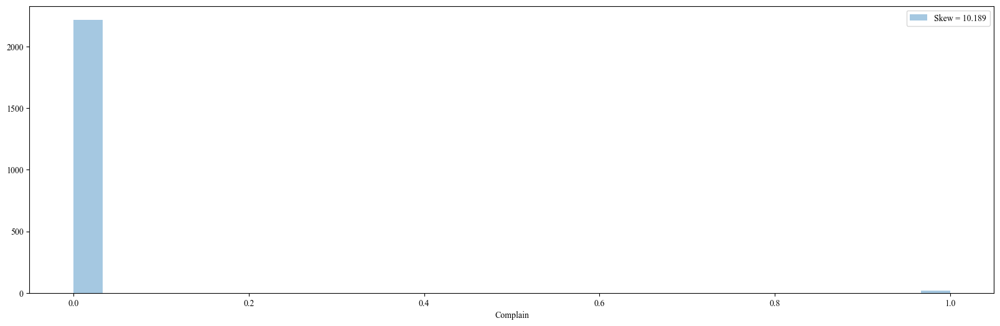

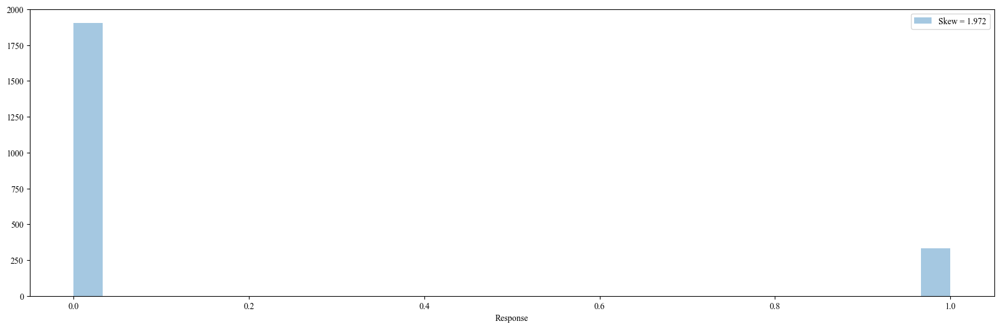

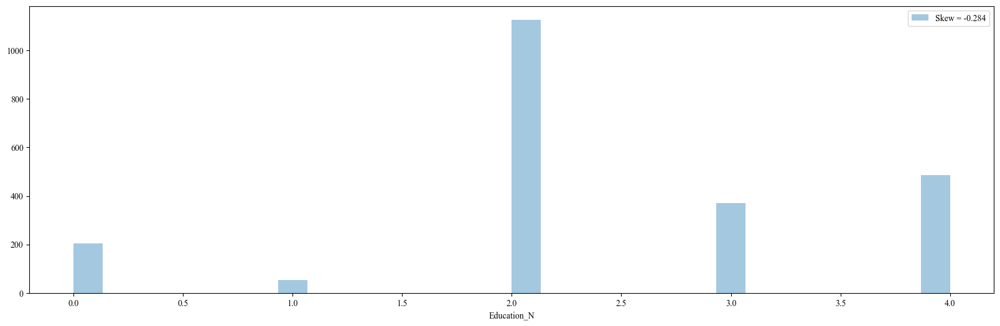

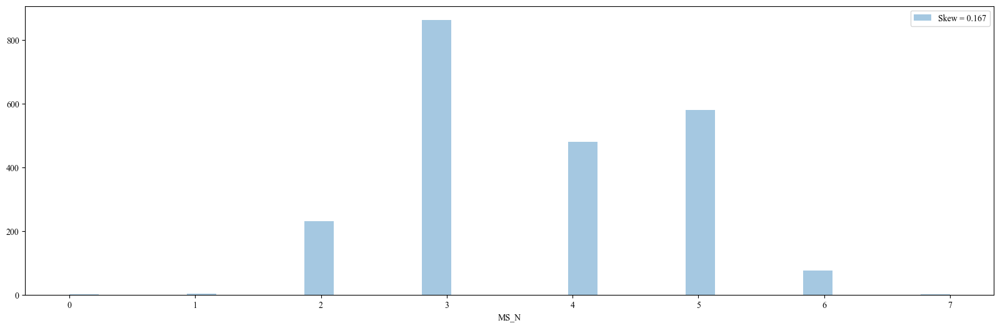

In [33]:
numerical_features=[feature for feature in ccsdata.columns if ccsdata[feature].dtypes != 'O']
for feat in numerical_features:
    f,ax = plt.subplots(figsize=(20,6))
    skew = ccsdata[feat].skew()
    sns.distplot(ccsdata[feat], kde= False, label='Skew = %.3f' %(skew), bins=30)
    plt.legend(loc='best')
    plt.show()

The complain column has highest skewness

### **Correlation Matrix** ###
Check for Assumption: Independent variables are independent of each other

In [34]:
ccsdata.head()

,YOB,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Education_N,MS_N
0,1957,58138.0,0,0,58,635,88,546,172,88,...,7,0,0,0,0,0,0,1,2,4
1,1954,46344.0,1,1,38,11,1,6,2,1,...,5,0,0,0,0,0,0,0,2,4
2,1965,71613.0,0,0,26,426,49,127,111,21,...,4,0,0,0,0,0,0,0,2,5
3,1984,26646.0,1,0,26,11,4,20,10,3,...,6,0,0,0,0,0,0,0,2,5
4,1981,58293.0,1,0,94,173,43,118,46,27,...,5,0,0,0,0,0,0,0,4,3


In [35]:
ccs_corr_data = pd.DataFrame()
ccs_corr_data[['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','AcceptedCmp1','AcceptedCmp2','Complain','Response']] = ccsdata[['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','AcceptedCmp1','AcceptedCmp2','Complain','Response']]

In [36]:
ccs_corr_data.corr()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
Income,1.000000,-0.424723,0.015498,-0.010603,0.570851,0.421910,0.565318,0.431879,0.424761,0.312600,...,0.579830,0.521456,-0.535452,-0.009682,0.174512,0.329995,0.267087,0.088132,-0.024489,0.136389
Kidhome,-0.424723,1.000000,-0.036133,0.008827,-0.496297,-0.372581,-0.437129,-0.387644,-0.370673,-0.349595,...,-0.502237,-0.499683,0.447846,0.014674,-0.161600,-0.205634,-0.172339,-0.081716,0.040207,-0.080008
Teenhome,0.015498,-0.036133,1.000000,0.016198,0.004846,-0.176764,-0.261160,-0.204187,-0.162475,-0.021725,...,-0.110769,0.050695,0.134884,-0.042677,0.038886,-0.191050,-0.140090,-0.015605,0.003138,-0.154446
Recency,-0.010603,0.008827,0.016198,1.000000,0.016064,-0.004306,0.023056,0.001079,0.022670,0.016693,...,0.025110,0.000799,-0.021445,-0.032991,0.018826,0.000129,-0.019283,-0.001781,0.013231,-0.198437
MntWines,0.570851,-0.496297,0.004846,0.016064,1.000000,0.389637,0.562667,0.399753,0.386581,0.387516,...,0.635226,0.642100,-0.320653,0.062202,0.373286,0.472613,0.354133,0.205907,-0.039007,0.247254
MntFruits,0.421910,-0.372581,-0.176764,-0.004306,0.389637,1.000000,0.543105,0.594804,0.567164,0.392995,...,0.487917,0.461758,-0.418383,0.014727,0.010152,0.215833,0.194748,-0.009773,-0.005166,0.125289
MntMeatProducts,0.565318,-0.437129,-0.261160,0.023056,0.562667,0.543105,1.000000,0.568402,0.523846,0.350609,...,0.723827,0.479659,-0.539470,0.018272,0.102912,0.373769,0.309761,0.043033,-0.023483,0.236335
MntFishProducts,0.431879,-0.387644,-0.204187,0.001079,0.399753,0.594804,0.568402,1.000000,0.579870,0.422875,...,0.534478,0.459855,-0.446003,0.000357,0.016843,0.199578,0.260762,0.002577,-0.020953,0.111331
MntSweetProducts,0.424761,-0.370673,-0.162475,0.022670,0.386581,0.567164,0.523846,0.579870,1.000000,0.369724,...,0.490924,0.448756,-0.423294,0.001530,0.028641,0.259590,0.241818,0.009985,-0.022485,0.117372
MntGoldProds,0.312600,-0.349595,-0.021725,0.016693,0.387516,0.392995,0.350609,0.422875,0.369724,1.000000,...,0.437697,0.381678,-0.250719,0.123091,0.022268,0.181021,0.166396,0.049990,-0.030861,0.139850


### **Normalization of the data using MinMaxScaler Function** ###

In [37]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
ccs_norm = pd.DataFrame()

ccs_norm[['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','AcceptedCmp1','AcceptedCmp2','Complain','Response','Education_N','MS_N']] = scaler.fit_transform(ccsdata[['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','AcceptedCmp1','AcceptedCmp2','Complain','Response','Education_N','MS_N']])
ccs_norm.head()

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Education_N,MS_N
0,0.087207,0.0,0.0,0.585859,0.425318,0.442211,0.316522,0.664093,0.334601,0.243094,...,0.35,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.5,0.571429
1,0.069516,0.5,0.5,0.383838,0.007368,0.005025,0.003478,0.007722,0.003802,0.016575,...,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.571429
2,0.107420,0.0,0.0,0.262626,0.285332,0.246231,0.073623,0.428571,0.079848,0.116022,...,0.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.714286
3,0.039969,0.5,0.0,0.262626,0.007368,0.020101,0.011594,0.038610,0.011407,0.013812,...,0.30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.5,0.714286
4,0.087440,0.5,0.0,0.949495,0.115874,0.216080,0.068406,0.177606,0.102662,0.041436,...,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.428571


In [38]:
ccs_corr_data = pd.DataFrame()
ccs_corr_data[['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','AcceptedCmp1','AcceptedCmp2','Complain','Response']] = ccsdata[['Income','Kidhome','Teenhome','Recency','MntWines','MntFruits','MntMeatProducts','MntFishProducts','MntSweetProducts','MntGoldProds','NumDealsPurchases','NumWebPurchases','NumCatalogPurchases','NumStorePurchases','NumWebVisitsMonth','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','AcceptedCmp1','AcceptedCmp2','Complain','Response']]

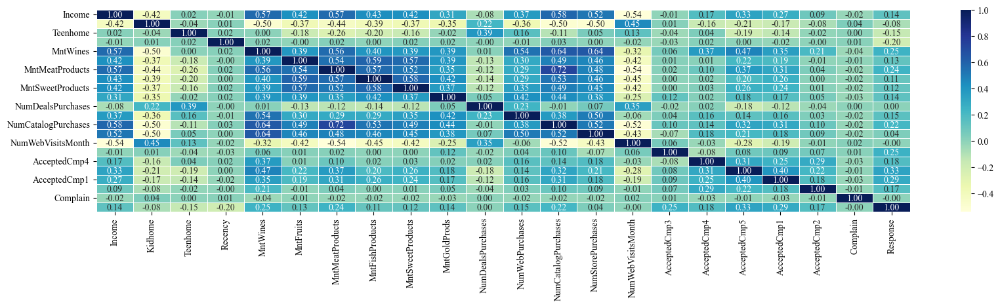

In [39]:
# Correlation Heatmap
f,ax = plt.subplots(figsize=(20,4))
sns.heatmap(ccs_corr_data.corr(), annot=True, linewidths =.5, fmt ='.2f',cmap="YlGnBu",ax=ax)
plt.show()

Based on the heatmap we see very less correlation between the individual entities. So the issue of colinearity problem will not arise.

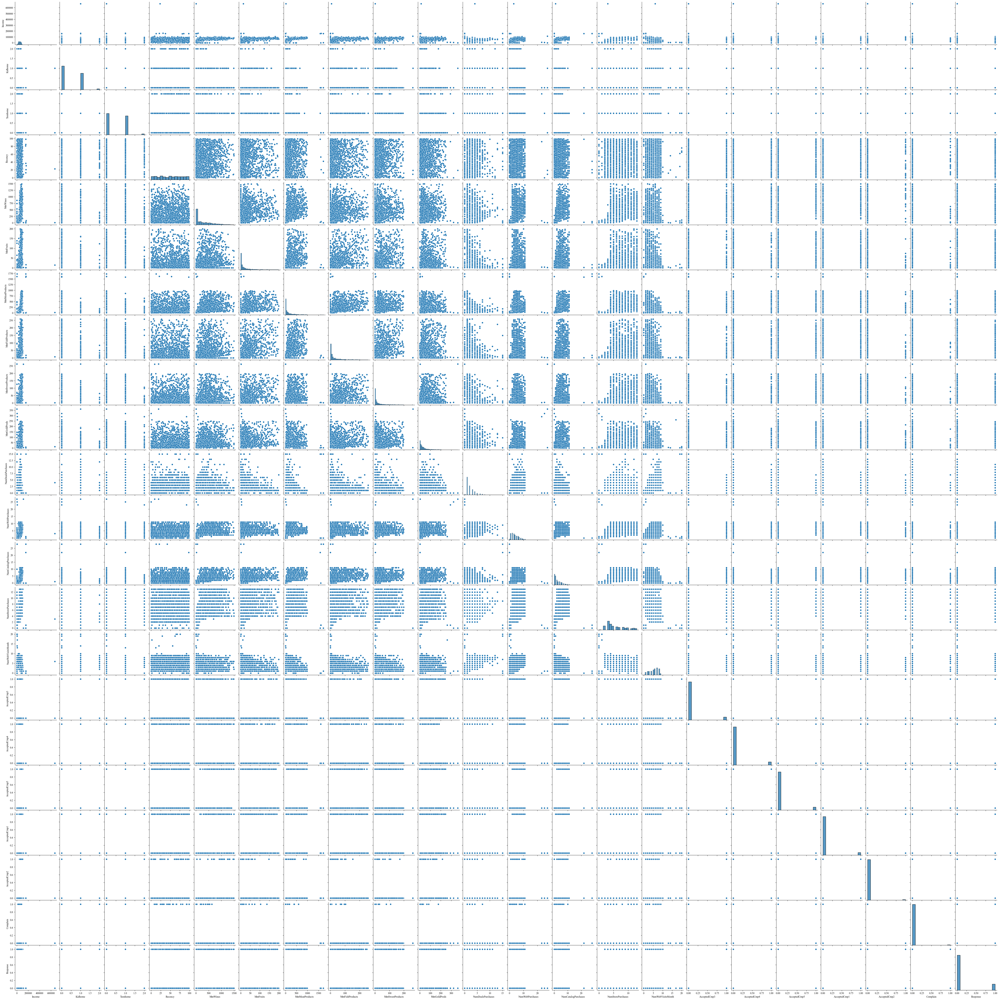

In [40]:
#Format the plot background and scatter plots for all the variables
import seaborn as sns
sns.pairplot(ccs_corr_data)

In [41]:
ccsdata.to_csv("auto_eda_data.csv")

### **Automated Exploratory Data Analysis (EDA)** ###

In [42]:
! pip install autoviz

In [43]:
import autoviz as av
import pandas as pd

Imported v0.1.803. After importing autoviz, you must run '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


In [44]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()

filename = 'auto_eda_data.csv'
depVar = 'CATEGORY_N'
sep=','

In [45]:
AV = AutoViz_Class()

In [46]:
%matplotlib inline

Shape of your Data Set loaded: (2240, 26)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  1
    Number of Integer-Categorical Columns =  17
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  7
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    26 Predictors classified...
        1 variable(s) removed since they were ID or low-information variables
        List of variables removed: ['Unnamed: 0']
To fix these data quality issues in the dataset, imp

    All variables classified into correct types.


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Unnamed: 0,int64,0.000000,100,0.000000,2239.000000,Possible ID column: drop before modeling step.
YOB,int64,0.000000,2,1893.000000,1996.000000,Column has 3 outliers greater than upper bound (2004.00) or lower than lower bound(1932.00). Cap them or remove them.
Income,float64,0.000000,NA,0.000000,666666.000000,Column has 8 outliers greater than upper bound (118641.38) or lower than lower bound(-15629.62). Cap them or remove them.
Kidhome,int64,0.000000,0,0.000000,2.000000,No issue
Teenhome,int64,0.000000,0,0.000000,2.000000,No issue
Recency,int64,0.000000,4,0.000000,99.000000,No issue
MntWines,int64,0.000000,34,0.000000,1493.000000,Column has 35 outliers greater than upper bound (1225.00) or lower than lower bound(-697.00). Cap them or remove them.
MntFruits,int64,0.000000,7,0.000000,199.000000,Column has 227 outliers greater than upper bound (81.00) or lower than lower bound(-47.00). Cap them or remove them.
MntMeatProducts,int64,0.000000,24,0.000000,1725.000000,Column has 175 outliers greater than upper bound (556.00) or lower than lower bound(-308.00). Cap them or remove them.
MntFishProducts,int64,0.000000,8,0.000000,259.000000,Column has 223 outliers greater than upper bound (120.50) or lower than lower bound(-67.50). Cap them or remove them.


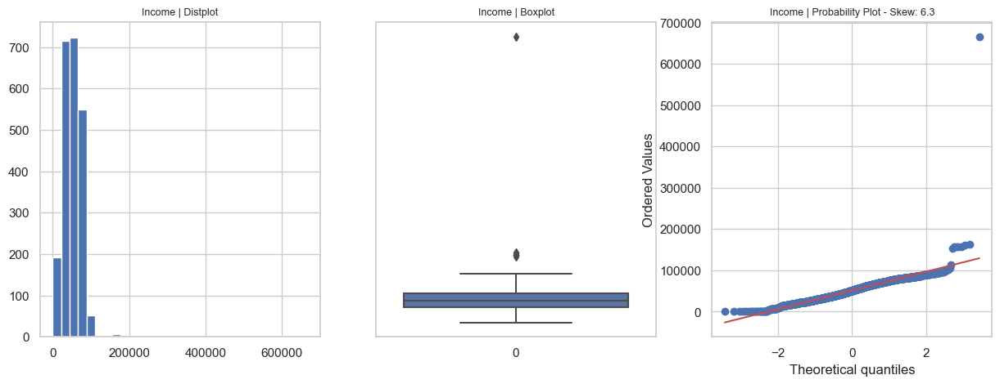

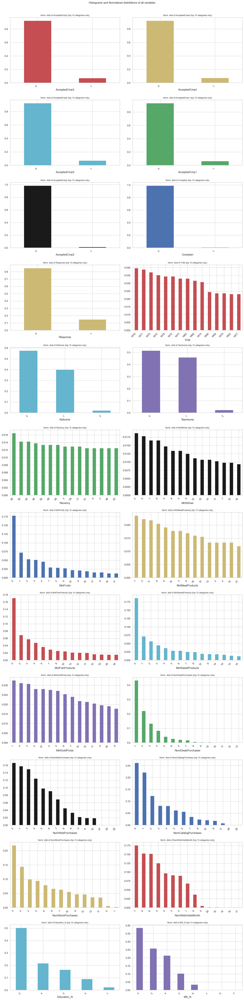

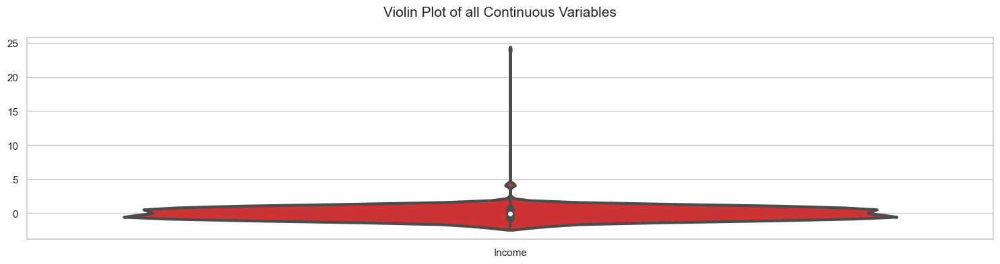

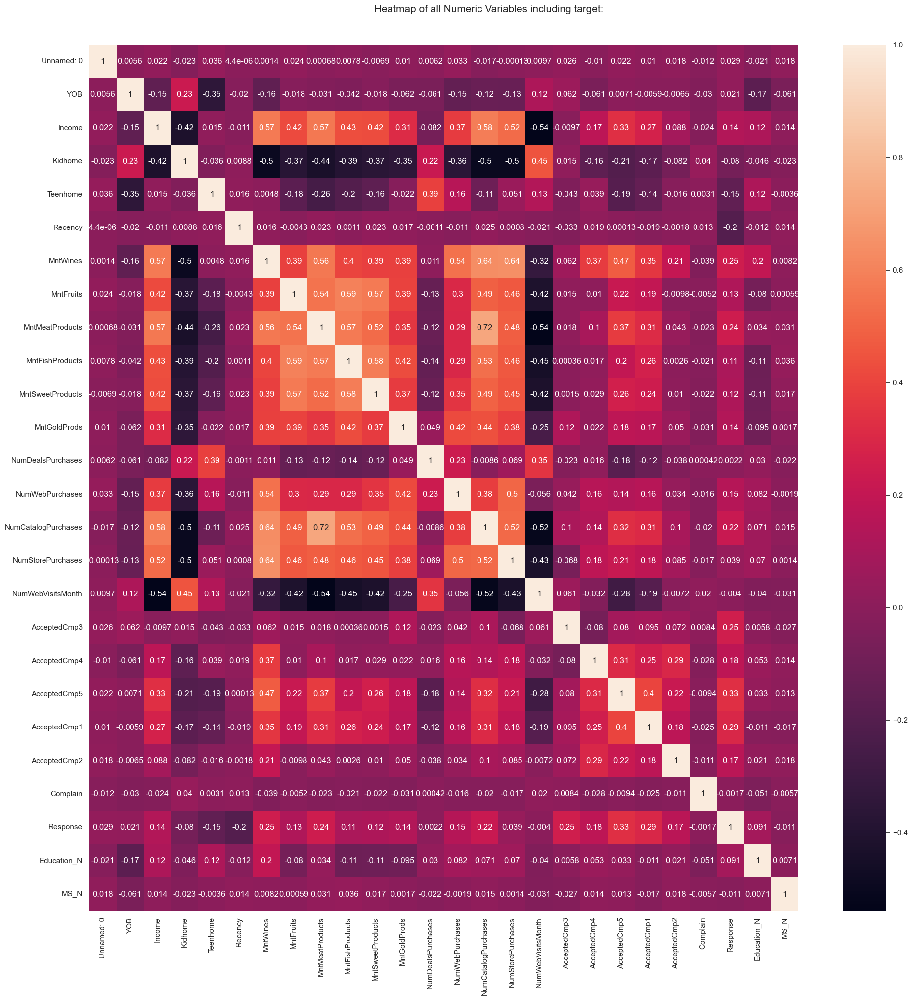

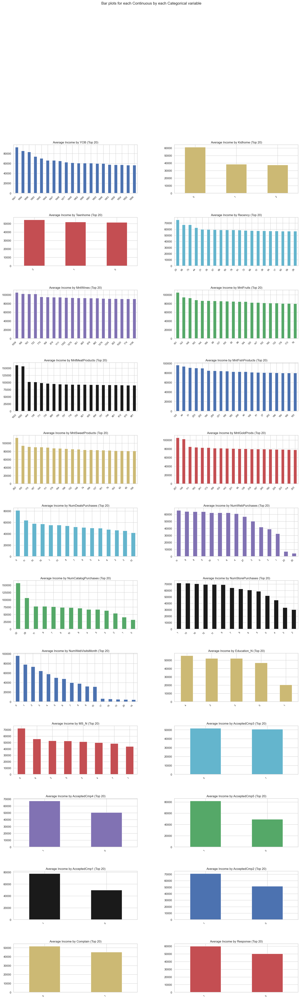

All Plots done
Time to run AutoViz = 29 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [47]:

_ = AV.AutoViz(filename)

## **Dimensionality Reduction using PCA** ##
### **PCA STEPS** ###

- PCA works on only normalized or standardized data. Hence, we have to convert the given data into maximum and minimum values
- Creating the Covariance Matrix from the converted data, using the cov() function in the numpy package
- Calculating the Eigen values and Eigen Vectors from the Covariance Matrix, using the eig() function of 'linalg'(linear algebra) module in numpy package
- Extracting the maximum Eigen values and corresponding Eigen Vectors
- Projecting the data on the Eigen Vectors with the dot operation, using the dot() method
- Applying the reduced dimensionality in any model i.e. Hierarchical and K-Means as required

In [48]:
from sklearn.decomposition import PCA

In [49]:
pca=PCA()
pca.fit(ccs_norm)

PCA()

In [50]:
pca.explained_variance_ratio_

array([0.23199304, 0.13309289, 0.0952927 , 0.08179948, 0.07013523,
       0.06413167, 0.05114362, 0.04201817, 0.03760745, 0.03567826,
       0.02609128, 0.02210559, 0.01685657, 0.01543772, 0.01282266,
       0.01155188, 0.0109203 , 0.01064967, 0.00940898, 0.00865747,
       0.0048053 , 0.00435812, 0.00278806, 0.0006539 ])

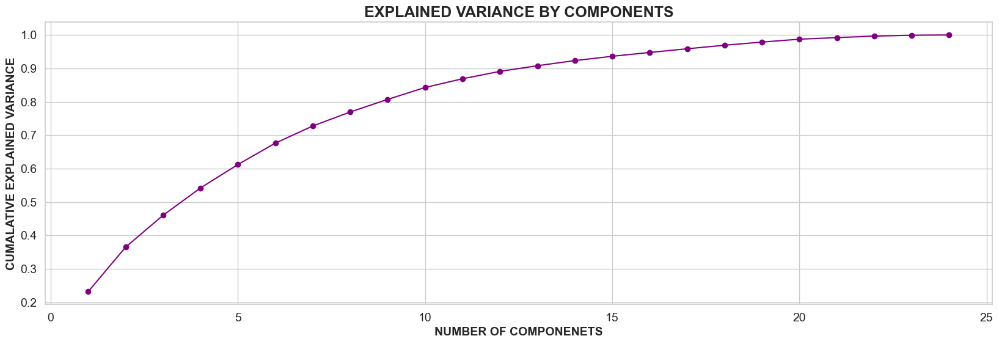

In [51]:
# Variance plot for PCA components obtained
plt.figure(figsize=(20,6))
plt.plot(range(1,25),pca.explained_variance_ratio_.cumsum(),marker='o',linestyle='-',color='#800080')
plt.title("EXPLAINED VARIANCE BY COMPONENTS", fontweight="bold", horizontalalignment="center", fontstyle = "normal", fontsize = "18")
plt.xlabel("NUMBER OF COMPONENETS", fontweight="bold", horizontalalignment="center", fontstyle = "normal", fontsize = "14")
plt.ylabel("CUMALATIVE EXPLAINED VARIANCE", fontweight="bold", horizontalalignment="center", fontstyle = "normal", fontsize = "14")
plt.xlabel("NUMBER OF COMPONENETS", fontweight="bold", horizontalalignment="center", fontstyle = "normal", fontsize = "14")
plt.xticks(rotation=0,  size = '13', fontsize = "14")
plt.yticks(rotation=0,  size = '13', fontsize = "14")
plt.show()

In order to capture 90% above accuracy we are only taking 10 dimensions so n_components=10

In [52]:
pca=PCA(n_components=10)

In [53]:
pca.fit(ccs_norm)

PCA(n_components=10)

In [54]:
scores_pca=pca.transform(ccs_norm)


## **DBSCAN CLUSTERING** ##

  File "c:\Users\Office\AppData\Local\Programs\Python\Python310\lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


epsilon: 0.8 ; labels: 18 ; min_sample: 4 ; number of clusters: 17 ; noise: 139 ; silhouette score:  0.21596922411076724
epsilon: 0.8 ; labels: 18 ; min_sample: 5 ; number of clusters: 17 ; noise: 156 ; silhouette score:  0.20544934089621555
epsilon: 0.8 ; labels: 17 ; min_sample: 6 ; number of clusters: 16 ; noise: 171 ; silhouette score:  0.1930258117801107
epsilon: 0.8 ; labels: 14 ; min_sample: 7 ; number of clusters: 13 ; noise: 193 ; silhouette score:  0.19168898202129406
epsilon: 0.8 ; labels: 14 ; min_sample: 8 ; number of clusters: 13 ; noise: 208 ; silhouette score:  0.18303667090013787
epsilon: 0.8 ; labels: 11 ; min_sample: 9 ; number of clusters: 10 ; noise: 231 ; silhouette score:  0.18284173064216855
epsilon: 0.9 ; labels: 20 ; min_sample: 4 ; number of clusters: 19 ; noise: 86 ; silhouette score:  0.23411041528785945
epsilon: 0.9 ; labels: 17 ; min_sample: 5 ; number of clusters: 16 ; noise: 103 ; silhouette score:  0.2312010518036615
epsilon: 0.9 ; labels: 16 ; min_sam

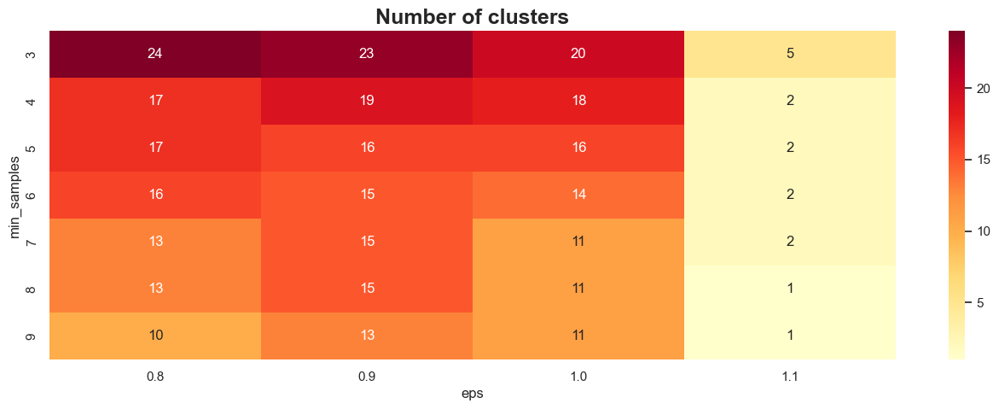


 Created the following 'Silhouette Score' matrix with eps and minmum_samples combinations

 eps             0.8       0.9       1.0       1.1  
min_samples                                        
3            0.217790  0.230761  0.211403  0.284866
4            0.215969  0.234110  0.209095  0.357178
5            0.205449  0.231201  0.207672  0.357016
6            0.193026  0.228034  0.203101  0.367929
7            0.191689  0.222565  0.201492  0.366763
8            0.183037  0.220831  0.197758  0.383500
9            0.182842  0.214850  0.197471  0.383500

 The following heat map shows the plotting for the Silhouette Score for different eps and minimum_samples combination


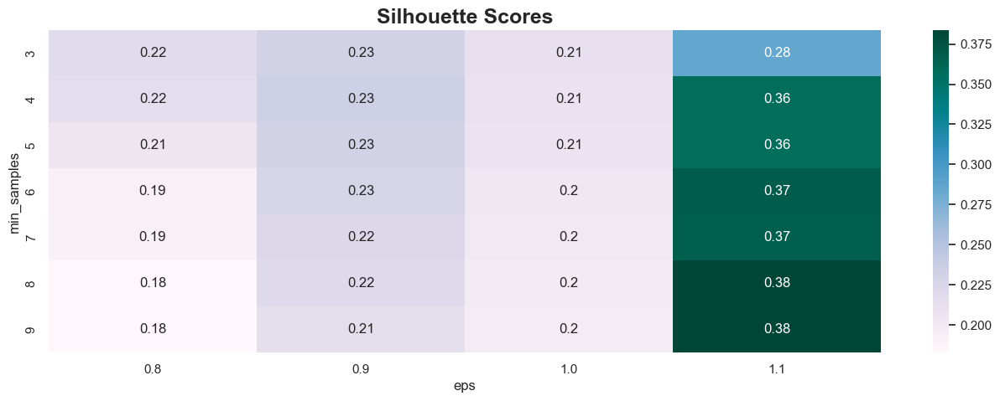

In [55]:
# Creating a heat map for the count of clusters created for different eps and min_sample combinations

c_eps = np.arange(0.8,1.1,0.1) # epsilon values
# c_min_samples = [1,2,3,4,5,6,7,8,9]  # min_samples to be taken
c_min_samples = [3,4,5,6,7,8,9]  # min_samples to be taken



c_clusters = []
c_min_sample = []
c_sil_score = []
c_max_value = [0,0,0,0,0,0]
high_values = [0,0,0,0,0,0]
cn_eps=[]

for e in (c_eps):
    for ms in (c_min_samples):
        crimes_dbc = DBSCAN(eps=e, min_samples=ms).fit(ccs_norm)
        labels = crimes_dbc.labels_
        label = len(set(labels))
        cnt_clusters = label - (1 if -1 in labels else 0) # Removing the count of outliers represented by -1
        c_clusters.append(cnt_clusters)
        cnt_noise = list(labels).count(-1) # All outliers or noise is represented by -1
        cn_eps.append(np.round(e,2))
        c_min_sample.append(ms)
        ss = silhouette_score(ccs_norm, crimes_dbc.fit_predict(ccs_norm), metric='euclidean')
        c_sil_score.append(ss)

        if ((cnt_clusters < 20) and (cnt_noise < 1000) and (int(cnt_clusters) > 2) and (int(ms) > 2)):
            print("epsilon:",np.round(e,2),"; labels:", label, "; min_sample:", ms,"; number of clusters:", cnt_clusters,"; noise:", cnt_noise,"; silhouette score: ", ss)
            if (ss > c_max_value[5]):
                c_max_value=(e,label,ms,cnt_clusters,cnt_noise,ss)
        else:
            pass

print(f"\n\nThe best combination is -", "epsilon:",np.round(c_max_value[0],2),"; labels:", c_max_value[1], "; min_sample:",c_max_value[2],"; number of clusters:", c_max_value[3],"; noise:", c_max_value[4],"; silhouette score: ", c_max_value[5]) # 0.2257103196361524


c_data = pd.DataFrame(columns=['clusters','min_samples'])
c_data['clusters'] = c_clusters
c_data['eps'] = cn_eps
c_data['min_samples'] = c_min_sample
c_data['silhouette_score'] = c_sil_score

c_clust_matrix = pd.pivot_table(c_data, index="min_samples", columns="eps", values="clusters")
print("\n","Created the following \'Clusters\' matrix with eps and minmum_samples combinations\n\n", c_clust_matrix)
print("\n","The following heat map shows the plotting for the clusters created using the different eps and minimum_samples combination")
fig, ax = plt.subplots(figsize=(16,5))
sns.heatmap(c_clust_matrix, annot=True, annot_kws={"size": 12}, cmap='YlOrRd', ax=ax)
plt.title('Number of clusters', fontweight="bold", horizontalalignment="center", fontstyle = "normal", fontsize = "18")
plt.show()

c_sil_matrix = pd.pivot_table(c_data, index="min_samples", columns="eps", values="silhouette_score")
print("\n","Created the following \'Silhouette Score\' matrix with eps and minmum_samples combinations\n\n", c_sil_matrix)
print("\n","The following heat map shows the plotting for the Silhouette Score for different eps and minimum_samples combination")
fig, ax = plt.subplots(figsize=(16,5))
sns.heatmap(c_sil_matrix, annot=True, annot_kws={"size": 12}, cmap='PuBuGn', ax=ax)
plt.title('Silhouette Scores', fontweight="bold", horizontalalignment="center", fontstyle = "normal", fontsize = "18")
plt.show()

In [56]:
from sklearn.pipeline import Pipeline

db_p_preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler())
    ]
)

In [57]:
db_p_clusterer = Pipeline(
    [
        (
            "dbscan",
            DBSCAN(
               eps=0.8,
               min_samples=8
                )
        )
    ]
)

In [58]:
db_p_pipe = Pipeline(
    [
        ("preprocessor", db_p_preprocessor),
        ("clusterer", db_p_clusterer)
    ]
)

In [59]:
db_p = db_p_pipe.fit(ccsdata)

In [60]:
prediction = pd.DataFrame()
db_pred=db_p.fit_predict(ccsdata)
prediction['DB_P']=db_pred
prediction['DB_P'].value_counts()

DB_P
 1     1598
-1      235
 0      141
 2       65
 6       65
 4       37
 3       31
 9       28
 8       16
 5       10
 7        9
 10       5
Name: count, dtype: int64

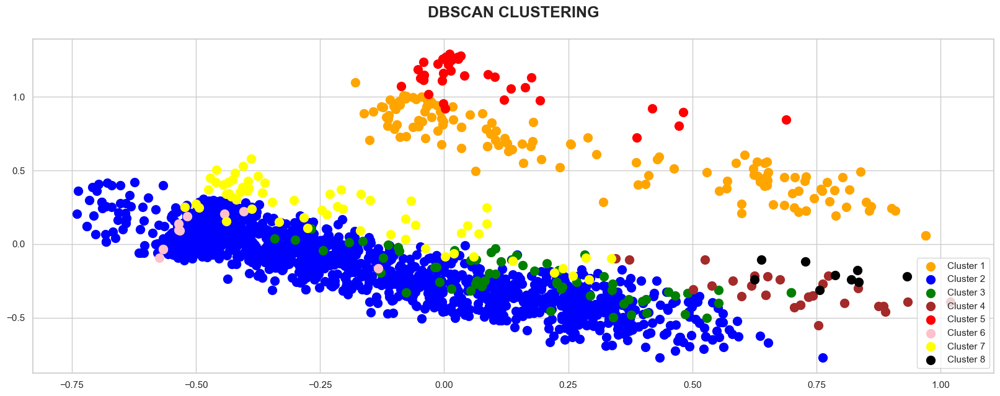

In [61]:
X = scores_pca
plt.figure(figsize=(20,7))
plt.scatter(X[db_pred==0, 0], X[db_pred==0, 1], s=100, c='orange', label ='Cluster 1')
plt.scatter(X[db_pred==1, 0], X[db_pred==1, 1], s=100, c='blue', label ='Cluster 2')
plt.scatter(X[db_pred==2, 0], X[db_pred==2, 1], s=100, c='green', label ='Cluster 3')
plt.scatter(X[db_pred==3, 0], X[db_pred==3, 1], s=100, c='brown', label ='Cluster 4')
plt.scatter(X[db_pred==4, 0], X[db_pred==4, 1], s=100, c='red', label ='Cluster 5')
plt.scatter(X[db_pred==5, 0], X[db_pred==5, 1], s=100, c='pink', label ='Cluster 6')
plt.scatter(X[db_pred==6, 0], X[db_pred==6, 1], s=100, c='yellow', label ='Cluster 7')
plt.scatter(X[db_pred==7, 0], X[db_pred==7, 1], s=100, c='black', label ='Cluster 8')
plt.title("DBSCAN CLUSTERING\n", fontweight="bold", horizontalalignment="center", fontstyle = "normal", fontsize = "18")
# Function add a legend
plt.legend(loc="lower right")
plt.show()

## **KMEANS CLUSTERING USING PIPELINE** ##

In [62]:
from sklearn.pipeline import Pipeline

km_p_preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("pca", PCA(n_components=10, random_state=42)),
    ]
)

In [63]:
n_clusters = 4

km_p_clusterer = Pipeline(
    [
        (
            "kmeans",
            KMeans(
                n_clusters=n_clusters,
                init="k-means++",
                n_init=50,
                max_iter=500,
                random_state=42,
                )
        )
    ]
)

In [64]:
km_p_pipe = Pipeline(
    [
        ("preprocessor", km_p_preprocessor),
        ("clusterer", km_p_clusterer)
    ]
)

In [65]:
km_p = km_p_pipe.fit(ccsdata)

In [66]:
km_p_predict=km_p.fit_predict(ccsdata)
prediction['KM_P']=km_p_predict
prediction['KM_P'].value_counts()

KM_P
1    1067
0     768
3     237
2     168
Name: count, dtype: int64

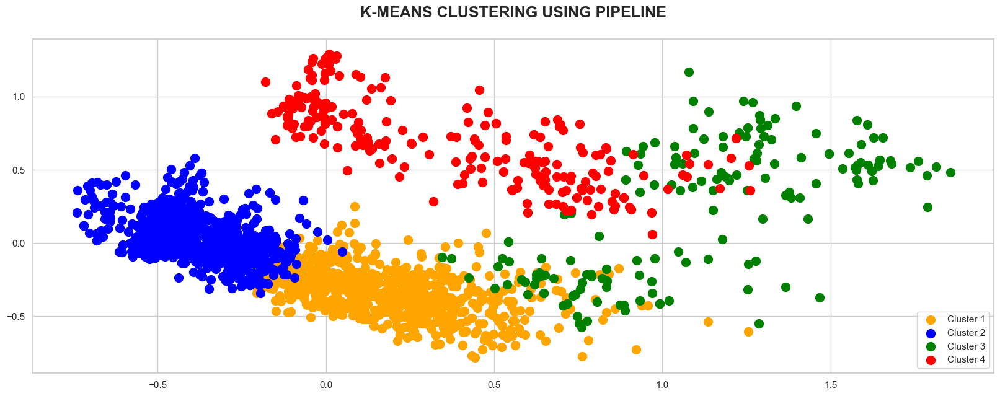

In [67]:
X = scores_pca
plt.figure(figsize=(20,7))
plt.scatter(X[km_p_predict==0, 0], X[km_p_predict==0, 1], s=100, c='orange', label ='Cluster 1')
plt.scatter(X[km_p_predict==1, 0], X[km_p_predict==1, 1], s=100, c='blue', label ='Cluster 2')
plt.scatter(X[km_p_predict==2, 0], X[km_p_predict==2, 1], s=100, c='green', label ='Cluster 3')
plt.scatter(X[km_p_predict==3, 0], X[km_p_predict==3, 1], s=100, c='red', label ='Cluster 4')
plt.title("K-MEANS CLUSTERING USING PIPELINE\n", fontweight="bold", horizontalalignment="center", fontstyle = "normal", fontsize = "18")
# Function add a legend
plt.legend(loc="lower right")
plt.show()

In [ ]:
prediction[prediction['KM_P']==3]
# prediction[prediction['KM_P']==1]
# prediction[prediction['KM_P']==2]
# prediction[prediction['KM_P']==3]
# prediction[prediction['KM_P']==4]
# ccsdata.iloc[8,:]

## **HIERARCHIAL CLUSTERING USING PIPELINE** ##

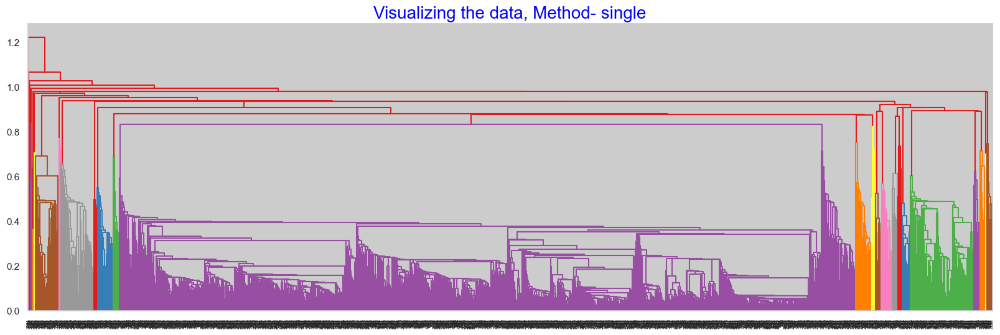

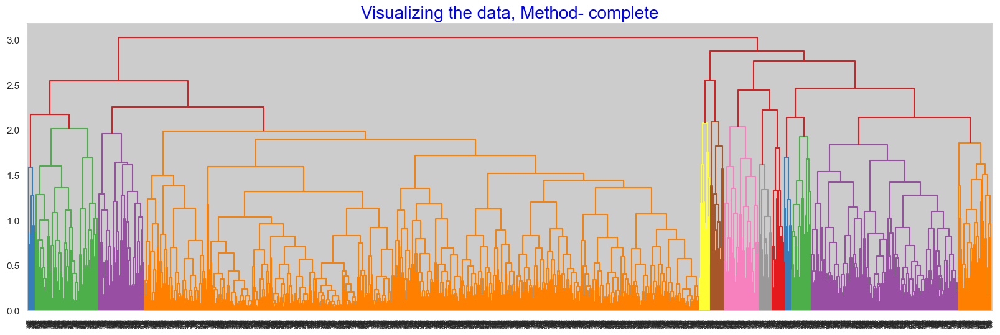

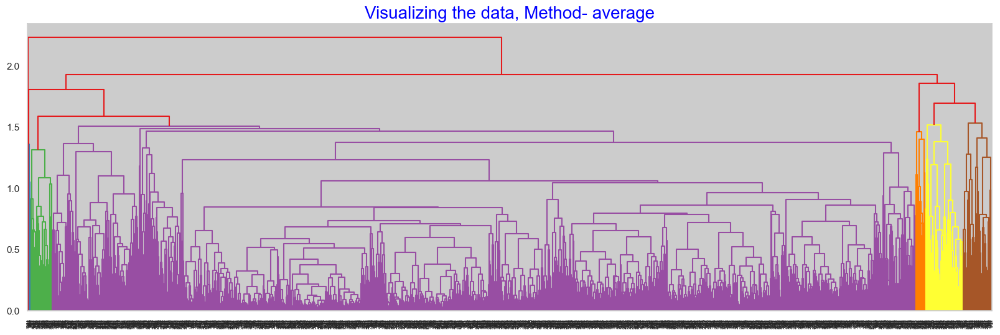

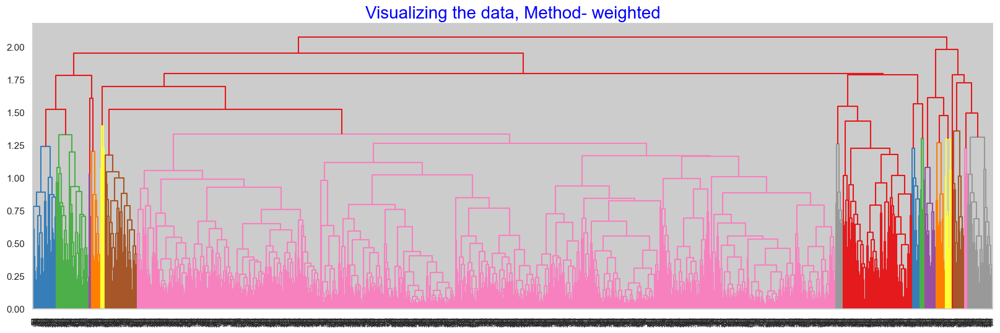

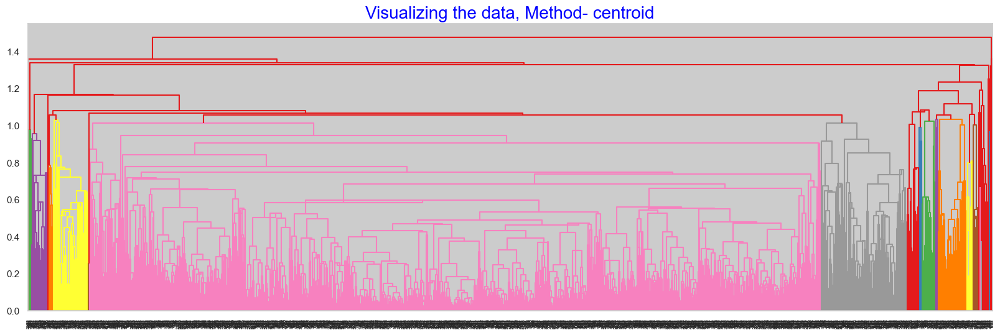

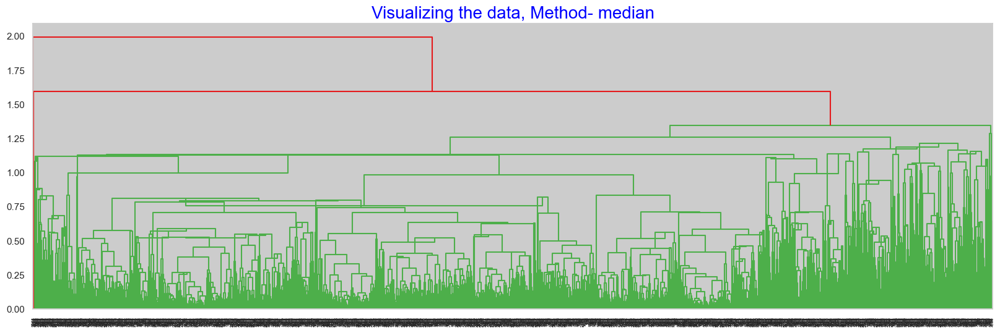

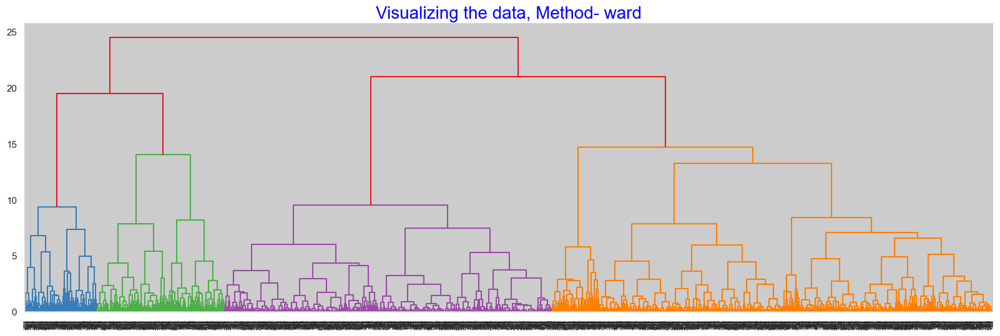

In [69]:
import scipy.cluster.hierarchy as sch # to build dendrogram and build the plotting

for methods in ['single','complete','average','weighted','centroid','median','ward']:
    plt.figure(figsize =(20, 6))
    dict = {'fontsize':20,'fontweight':10, 'color':'blue'}
    plt.title('Visualizing the data, Method- {}'.format(methods),fontdict = dict)
    dendrogram = sch.dendrogram(sch.linkage(scores_pca, method=methods,optimal_ordering=False))

In [70]:
from sklearn.pipeline import Pipeline

hc_p_preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("pca", PCA(n_components=2, random_state=42)),
    ]
)

In [71]:
n_clusters = 4

hc_p_clusterer = Pipeline(
    [
        (
            "Hierarchial",
            AgglomerativeClustering(
                n_clusters=n_clusters,
                affinity='euclidean',linkage='ward'
            )
        )
    ]
)

In [72]:
hc_p_pipe = Pipeline(
    [
        ("preprocessor", hc_p_preprocessor),
        ("clusterer", hc_p_clusterer)
    ]
)

In [73]:
hc_p = hc_p_pipe.fit(ccsdata)

In [74]:
hc_p_predict=hc_p.fit_predict(ccsdata)
prediction['HC_P']=hc_p_predict
prediction['HC_P'].value_counts()

HC_P
0    997
2    906
1    220
3    117
Name: count, dtype: int64

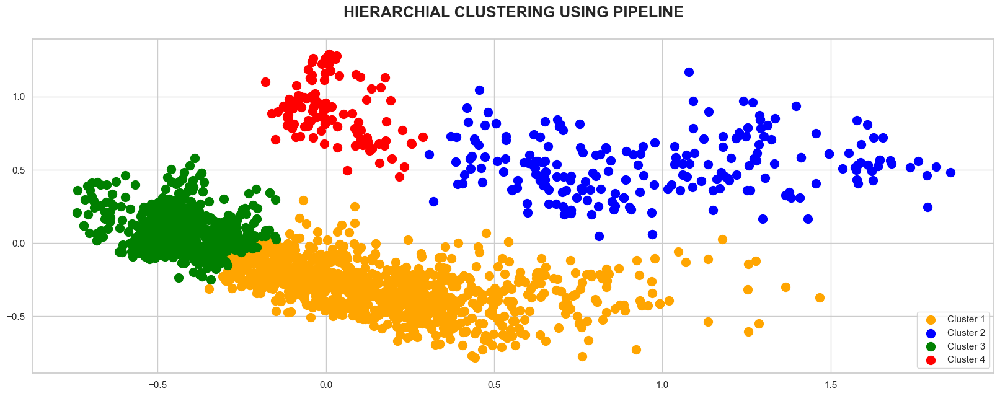

In [75]:
X = scores_pca
plt.figure(figsize=(20,7))
plt.scatter(X[hc_p_predict==0, 0], X[hc_p_predict==0, 1], s=100, c='orange', label ='Cluster 1')
plt.scatter(X[hc_p_predict==1, 0], X[hc_p_predict==1, 1], s=100, c='blue', label ='Cluster 2')
plt.scatter(X[hc_p_predict==2, 0], X[hc_p_predict==2, 1], s=100, c='green', label ='Cluster 3')
plt.scatter(X[hc_p_predict==3, 0], X[hc_p_predict==3, 1], s=100, c='red', label ='Cluster 4')
plt.title("HIERARCHIAL CLUSTERING USING PIPELINE\n", fontweight="bold", horizontalalignment="center", fontstyle = "normal", fontsize = "18")
# Function add a legend
plt.legend(loc="lower right")
plt.show()

In [76]:
prediction.to_csv("prediction.csv")

In [77]:
# prediction[prediction['KM_P']==3]
# prediction[prediction['KM_P']==1]
# prediction[prediction['KM_P']==2]
# prediction[prediction['KM_P']==3]
# prediction[prediction['KM_P']==4]
# ccsdata.iloc[8,:]

## **PREDICTION ON KMEANS** ##

In [78]:
# Splitting the data into training and testing sets, testing sample size being 20% and using the testing set for prediction

from sklearn.model_selection import train_test_split
train,test = train_test_split(ccsdata, test_size=0.2,random_state=0)

In [79]:
test.shape

(448, 25)

In [81]:
# km_p_predict=km_p.fit_predict(test)
# prediction['KM_P']=km_p_predict
# prediction['KM_P'].value_counts()

In [82]:
km_p_predict = pd.Series(km_p_predict)

In [83]:
new_df=pd.DataFrame()
new_df=test.iloc[[2,21,213,12,13,1,292,436],:]
new_df

,YOB,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Education_N,MS_N
39,1943,48948.0,0,0,53,437,8,206,160,49,42,2,7,10,5,6,1,0,0,0,0,0,1,4,2
1953,1976,72335.0,0,0,2,1285,105,653,28,21,0,1,10,4,8,8,0,0,0,0,0,0,1,4,5
746,1975,17003.0,1,0,37,2,5,12,4,8,7,3,2,0,4,5,0,0,0,0,0,0,0,0,3
781,1976,36283.0,1,1,42,6,5,5,8,0,5,2,1,0,3,4,0,0,0,0,0,0,0,2,5
478,1972,62010.0,0,1,93,371,22,39,6,0,92,4,6,2,7,5,0,0,0,0,0,0,0,4,3
570,1974,44989.0,0,1,26,98,0,106,49,10,106,5,5,1,5,6,0,0,0,0,0,0,0,2,3
557,1982,79908.0,0,0,30,557,129,761,29,185,111,1,5,6,7,2,0,0,1,0,0,0,0,2,3
1492,1988,87679.0,0,0,62,1259,172,815,97,148,33,1,7,11,10,4,1,0,1,1,0,0,1,2,5


In [87]:
new_df.to_csv("new_df.csv")

In [84]:
n=prediction.iloc[[2,21,213,12,13,1,292,436],:]
n

,DB_P,KM_P,HC_P
2,1,0,0
21,-1,1,2
213,1,1,2
12,1,0,0
13,1,1,2
1,1,1,2
292,3,2,0
436,1,0,0


In [85]:
import pickle
pickle.dump(km_p, open('KMEANS.pkl', 'wb'))
pickled_kmeans = pickle.load(open('KMEANS.pkl', 'rb'))

In [86]:
prediction1 = pickled_kmeans.predict(new_df)
print("The 'kmeans model' predication based on the initial model 'prediction' is: ", prediction1)

The 'kmeans model' predication based on the initial model 'prediction' is:  [3 3 1 1 2 2 0 0]
